In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="API_CODE")
project = rf.workspace("1-btccx").project("cat-breeds-2oxx4")
version = project.version(5)
dataset = version.download("yolov11")

^C
ERROR: Operation cancelled by user
loading Roboflow workspace...
loading Roboflow project...


In [8]:
!pip install ultralytics

In [9]:
!yolo task=detect mode=train data=/kaggle/working/cat-breeds-5/data.yaml model=yolov8n.pt epochs=100 imgsz=640

Ultralytics 8.3.40 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/cat-breeds-5/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

In [10]:
!yolo task=detect mode=val model=/kaggle/working/runs/detect/train2/weights/best.pt data=/kaggle/working/cat-breeds-5/data.yaml

Ultralytics 8.3.40 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /kaggle/working/cat-breeds-5/valid/labels.cache... 155 images, 0 b
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        155        159      0.785      0.821      0.846      0.741
        Abyssinian cat         43         44      0.975      0.876      0.965      0.744
                Birman         45         45       0.92      0.844      0.932      0.746
      Exotic Shorthair          4          4          1      0.848      0.995       0.81
            Maine Coon         42         44          1       0.87      0.986      0.757
    Oriental Shorthair          1          1      0.871          1      0.995      0.995
           Persian cat          5          5      0.802          1      0.995      0.976
               Ragdoll          5          5      0.512   

In [ ]:
!yolo task=detect mode=predict model=/kaggle/working/runs/detect/train2/weights/best.pt source=/kaggle/working/cat-breeds-5/test/images

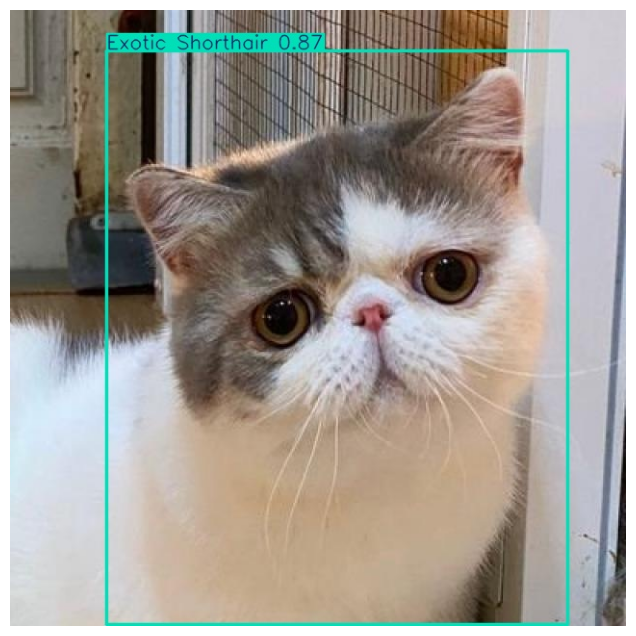

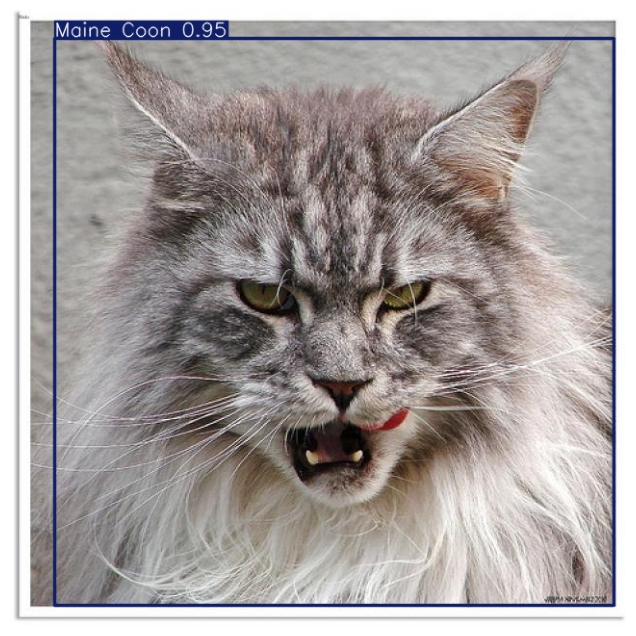

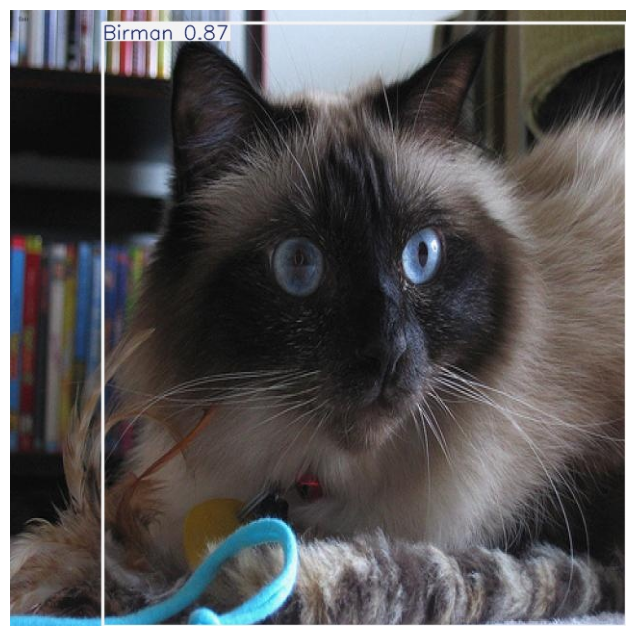

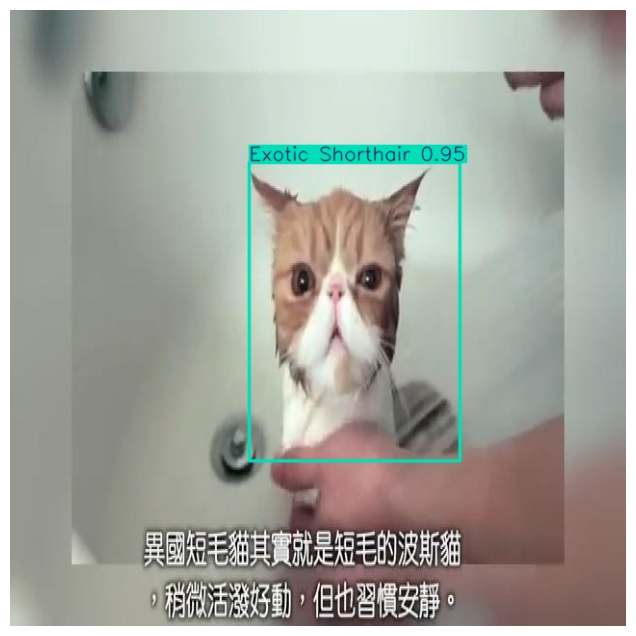

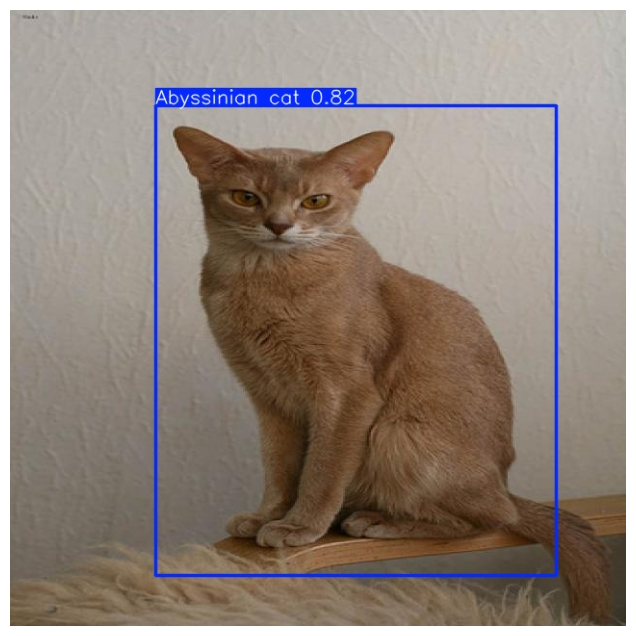

...

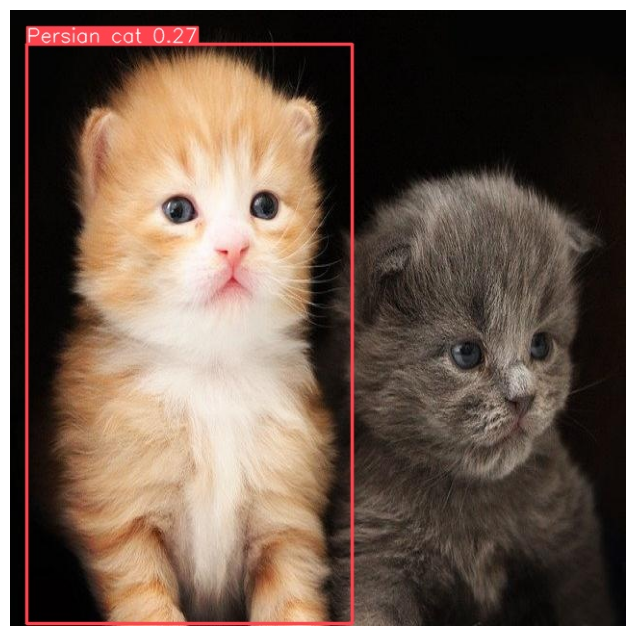

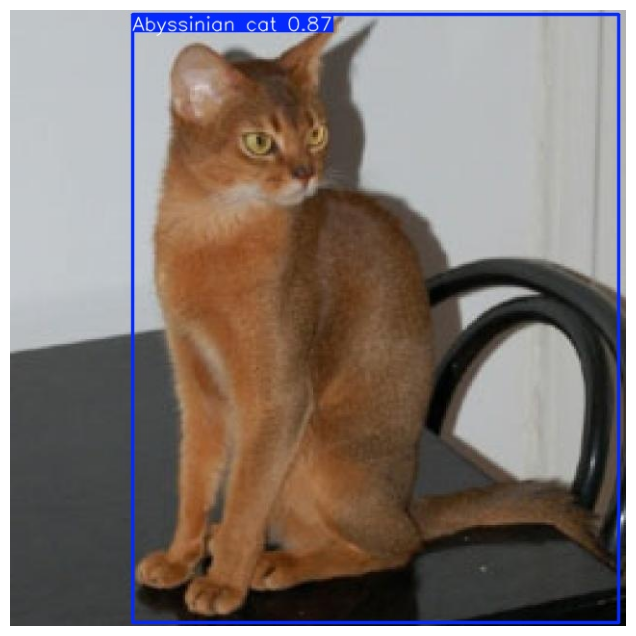

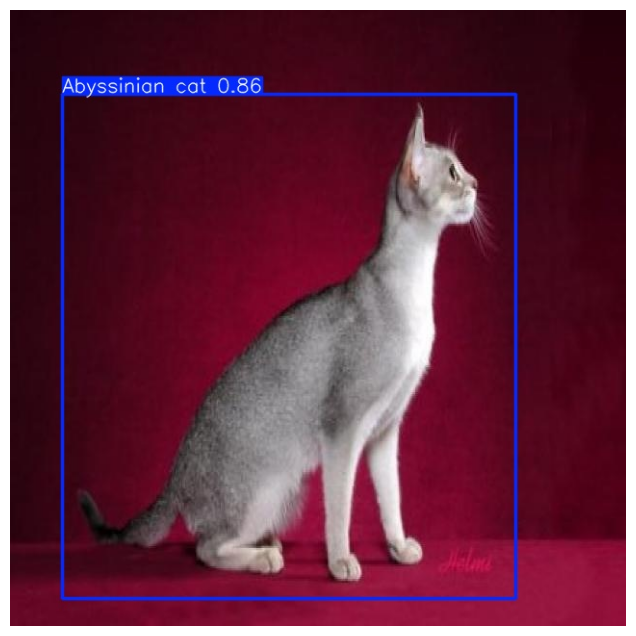

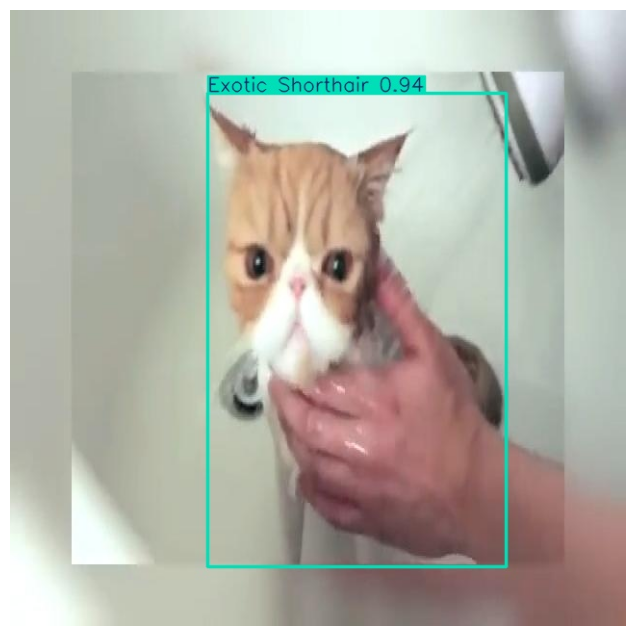

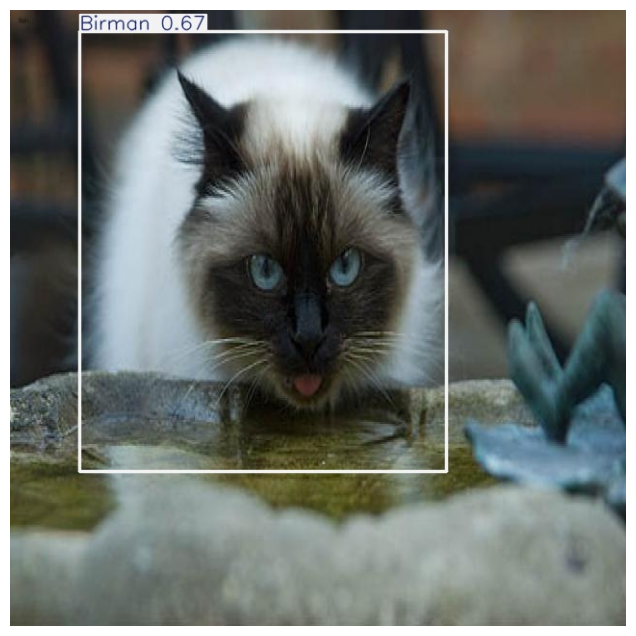

In [13]:
import cv2
import matplotlib.pyplot as plt
import glob

# Load predicted images
predicted_images = glob.glob('runs/detect/predict2/*.jpg')

# Plot first 5 images
for img_path in predicted_images[:20]:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.show()


In [14]:
!pip install yt-dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.1/172.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 39.0 MB/s eta 0:00:0000:0100:01


In [18]:
!yt-dlp -f best -o "input_video.mp4" https://www.youtube.com/watch?v=paWE-GvDO1c

         To let yt-dlp download and merge the best available formats, simply do not pass any format selection.
         If you know what you are doing and want only the best pre-merged format, use "-f b" instead to suppress this warning
[youtube] Extracting URL: https://www.youtube.com/watch?v=paWE-GvDO1c
[youtube] paWE-GvDO1c: Downloading webpage
[youtube] paWE-GvDO1c: Downloading ios player API JSON
[youtube] paWE-GvDO1c: Downloading mweb player API JSON
[youtube] paWE-GvDO1c: Downloading player 85d2de62
[youtube] paWE-GvDO1c: Downloading m3u8 information
[info] paWE-GvDO1c: Downloading 1 format(s): 18
[download] Destination: input_video.mp4
[download] 100% of   64.54MiB in 00:00:01 at 47.84MiB/s;33m00:00


In [ ]:
!yolo task=detect mode=predict model=runs/detect/train2/weights/best.pt source=input_video.mp4 conf=0.5